# Advanced Lane Lines Detection

The goal of this project is to develop a pipeline to process a video stream from a forward-facing camera mounted on the front of a car and output an annotated video which identifies:

- The positions of the lane lines
- The location of the vehicle relative to the center of the lane
- The radius of curvature of the road

Requirements:
    1) Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    2) Apply a distortion correction to raw images.
    3) Apply a perspective transform to rectify image ("birds-eye view").
    4) Use color transforms, gradients, etc., to create a thresholded binary image.
    5) Detect lane pixels and fit to find the lane boundary.
    6) Determine the curvature of the lane and vehicle position with respect to center.
    7) Warp the detected lane boundaries back onto the original image.
    8) Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [8]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from collections import deque

%matplotlib inline

## 1. Camera Calibration

The first step to detect lane line efficiently is to calibrate camera and then remove any distortion from the images after calculating the camera calibration matrix and distortion coefficients using a series of chessboard images.


In [9]:
def tranformImageColor(image, color_space):     
    return cv2.cvtColor(image, color_space)

def calibrateCamera(image, read=True):
    if read:
        img = cv2.imread(image)
        
    # Identify image size
    img_size = (image.shape[1], image.shape[0])
    
    # Calculate calbration matrix
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img_size, None, None)
    
    return ret, mtx, dist, rvecs, tvecs

def identifyChessboardCorners(image, gray, iname, pattern_size):
     # Find chessboard corners
    found, corners = cv2.findChessboardCorners(gray, pattern_size, None)
    
    if found: 
        obj_points.append(objp)
        img_points.append(corners)
        
        # Draw chessboard corners
        cv2.drawChessboardCorners(img, pattern_size, corners, found)
        
        #Calibrate
        calibrateCamera(img, False)
        
        # Visualize chessboard image with corners
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(iname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original' + '\n' + iname, fontsize=12)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Corners identified' + '\n' + iname, fontsize=12)

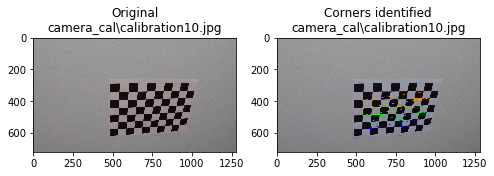

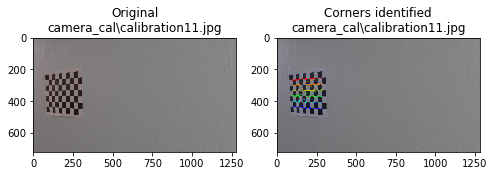

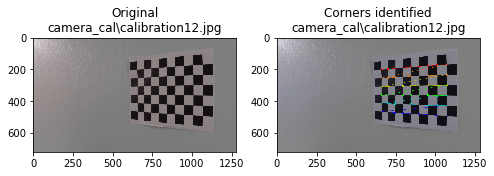

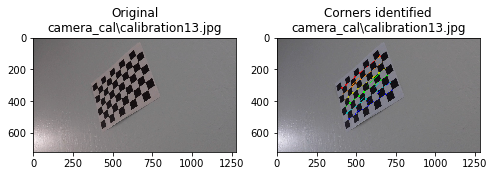

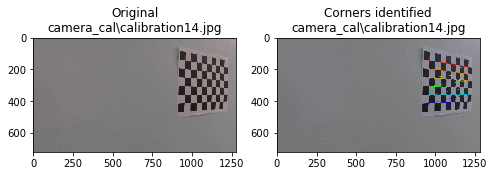

...

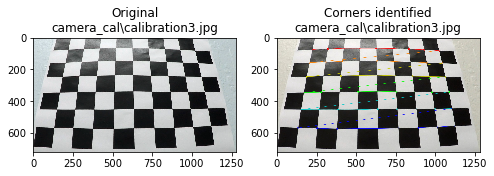

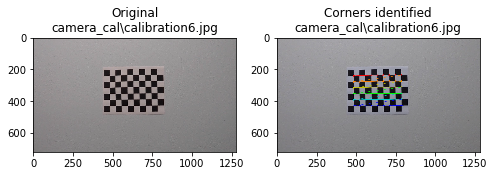

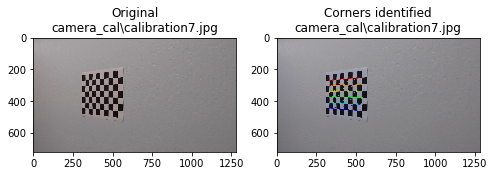

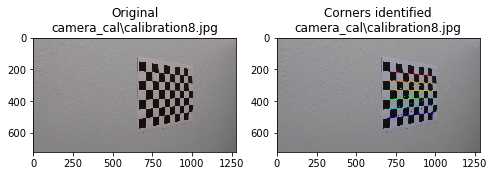

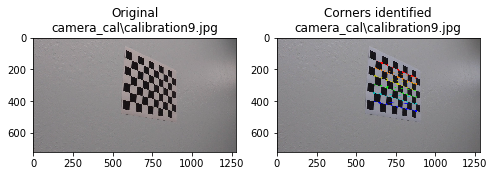

In [10]:
pattern_size = (9,6)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

obj_points = [] # 3d points in real world space.
img_points = [] # 2d points in image plane.


# Read all chessboard images
images = glob.glob('camera_cal/calibration*.jpg')
images.sort()

# Iterate through images and calculate chessboard corners
for i, iname in enumerate(images):
    # Read the image
    img = cv2.imread(iname)
    
    # Convert image to Gray scale
    gray = tranformImageColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find chessboard corners and Calibrate
    identifyChessboardCorners(img, gray, iname, pattern_size)

## 2. Distortion correction

Here I define a function to undistort images which uses previously calculated camera calibration matrix and distortion coefficients to remove distortions from images and output more realistic undistorted image.

In [11]:
# Removes distortion from a given image
def undistort(image, plot=True, read=True): 
    if read:
        img = cv2.imread(image)
    
    # Calibrate
    ret, mtx, dist, rvecs, tvecs = calibrateCamera(img, False)
    
    #Undistort
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,6))
        ax1.imshow(tranformImageColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Distorted Image' + '\n' + image, fontsize=12)
        ax2.imshow(tranformImageColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image' + '\n' + image, fontsize=12)
    else:
        return undist

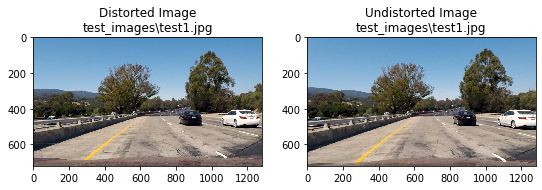

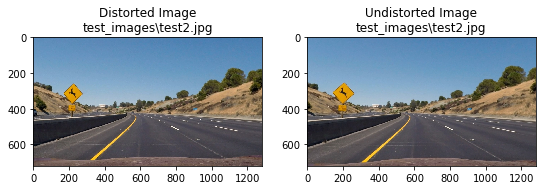

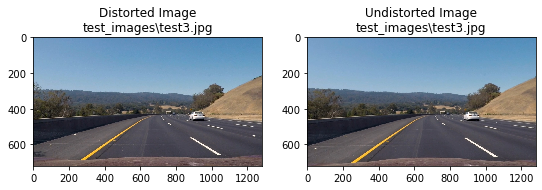

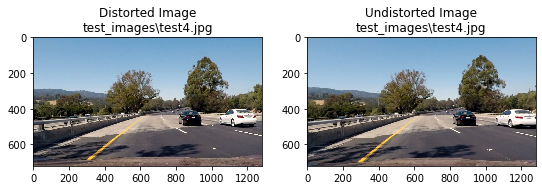

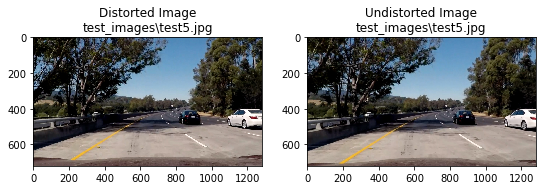

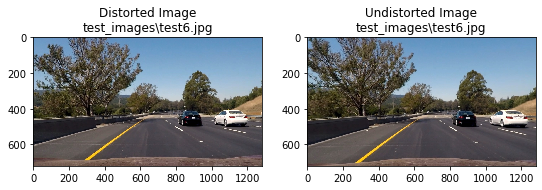

In [12]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    undistort(image)

## 3. Perspective transform

In this step I will define a function birdsEye() which transforms the undistorted image of the road to a "birds eye view" which focuses only on the lane lines and displays them in such a way that they appear to be relatively parallel to eachother. This will make it easier later on to fit polynomials to the lane lines and measure the curvature.


In [13]:
def birdsEye(img, plot=True, read = True):
    if read:
        undist = undistort(img, plot=False)
    else:
        undist = undistort(img, plot=False, read=False)
        
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax1.set_title('Undistorted Image' + '\n' + image, fontsize=12)
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Warped Image' + '\n' + image, fontsize=12)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    else:
        return warped, M

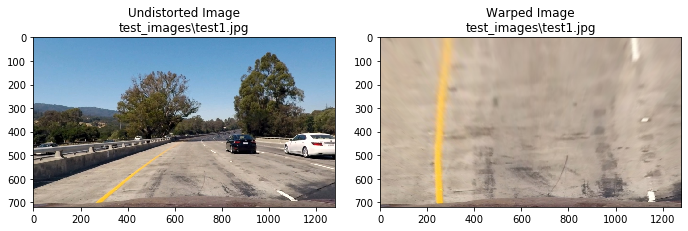

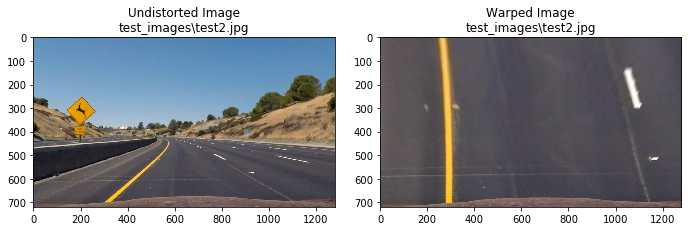

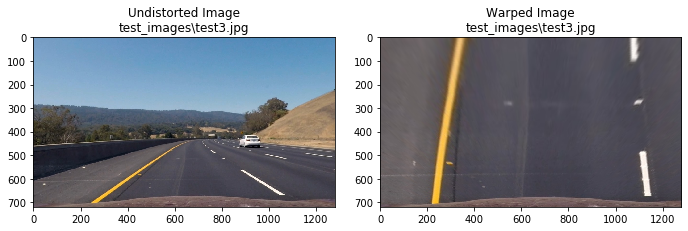

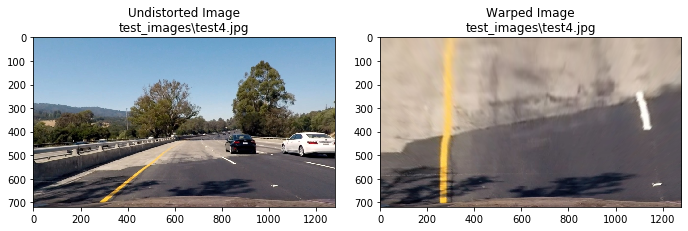

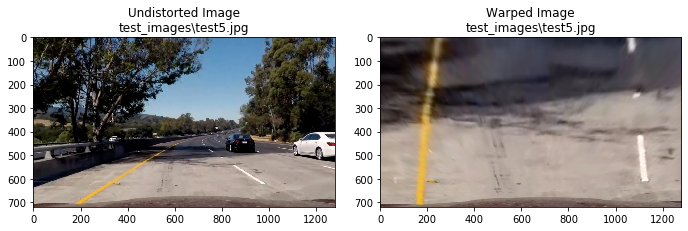

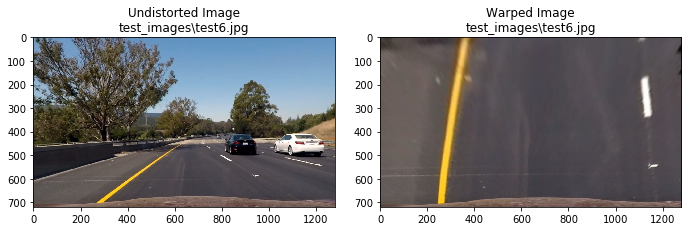

In [14]:
for image in glob.glob('test_images/test*.jpg'):
    birdsEye(image)

## 4. Color (gradient) threshold

Here I convert all undistorted warped images into a better color space and then create a binary gradient threshhold which focuses more on the lane lines and highlights them only. Here I represent the best color channels and thresholds I discovered by completing all the the lessons:

The S channel from the HLS color space

Minimum: 180
Maximum: 255
(+) Best for both yellow and white lane lines
(-) Did not pick up 100% of pixles
The L channel from the LUV color space

Minimum: 255
Maximum: 255
(+) Best for white lane lines
(-) Not good for yellow lane lines
The B channel from the LAB color space

Minimum: 155
Maximum: 200
(+) Best for white yellow lines
(-) Not good for white lane lines
In function below, combined binary threshold is used in regard of getting the best results.

In [15]:
# Create a binary threshholded image to identify lane lines pixels only
def applyThreshold(image, plot=True):
    img, M = birdsEye(image, plot = False)

    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if plot == True:
        # Plotting thresholded images
        f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, sharey='col', sharex='row', figsize=(10,8))
        f.tight_layout(h_pad=4)
        
        ax1.set_title('Original Image' + '\n' + image, fontsize=12)
        ax1.imshow(cv2.cvtColor(undistort(image, plot=False),cv2.COLOR_BGR2RGB))
        
        ax2.set_title('Warped Image' + '\n' + image, fontsize=12)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype('uint8'))
        
        ax3.set_title('S binary threshold' + '\n' + image, fontsize=12)
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('B binary threshold' + '\n' + image, fontsize=12)
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('L binary threshold' + '\n' + image, fontsize=12)
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined color thresholds' + '\n' + image, fontsize=12)
        ax6.imshow(combined_binary, cmap='gray')
        
    else: 
        return combined_binary

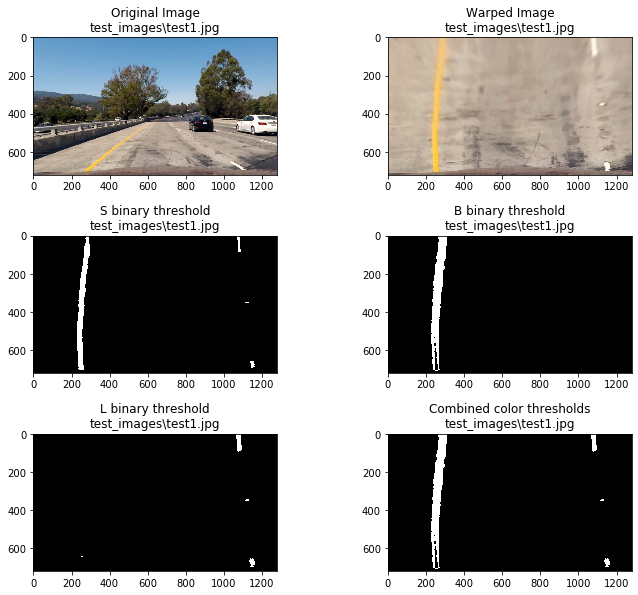

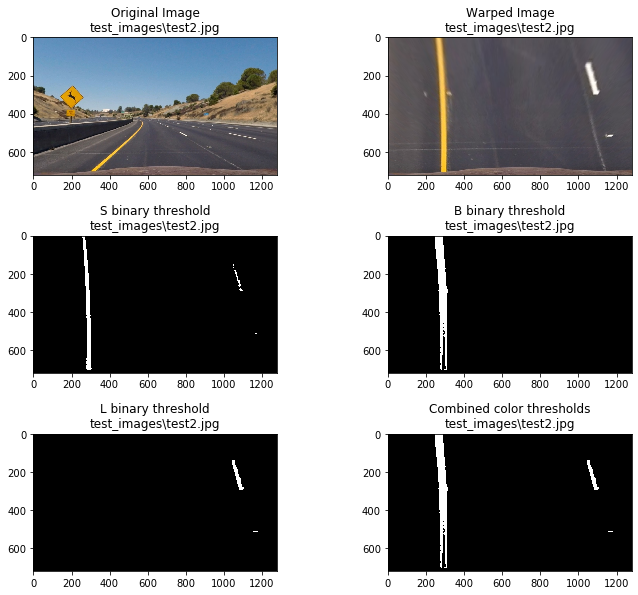

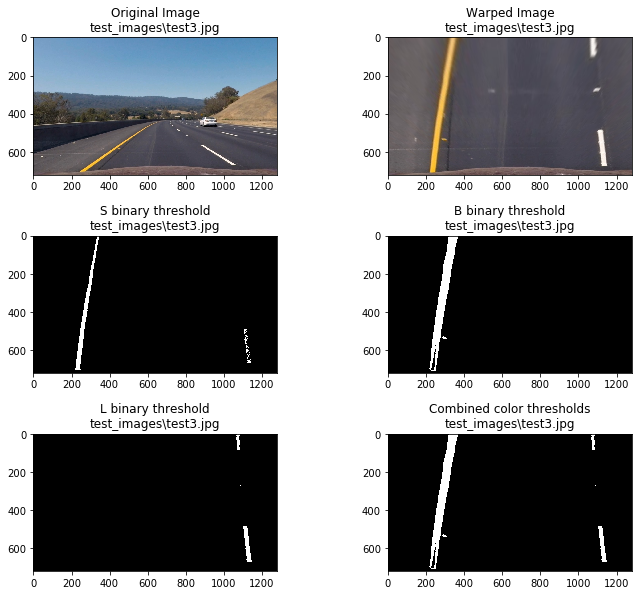

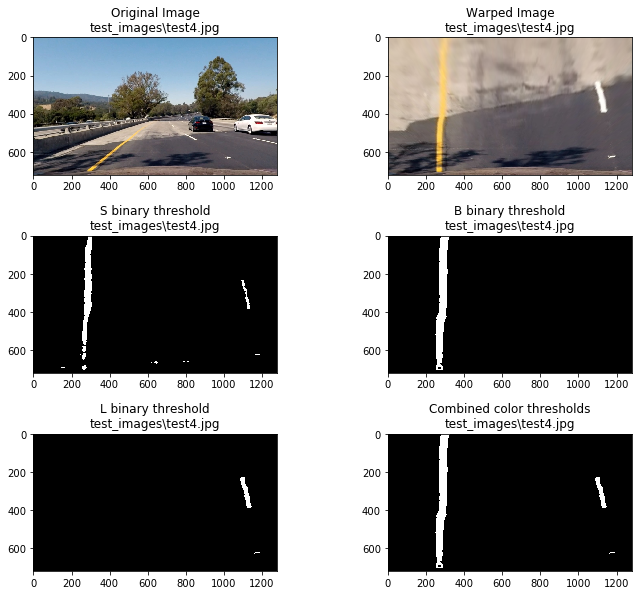

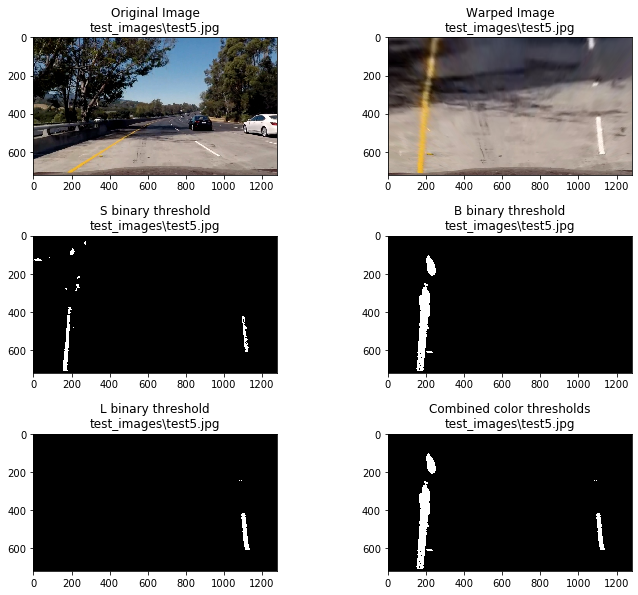

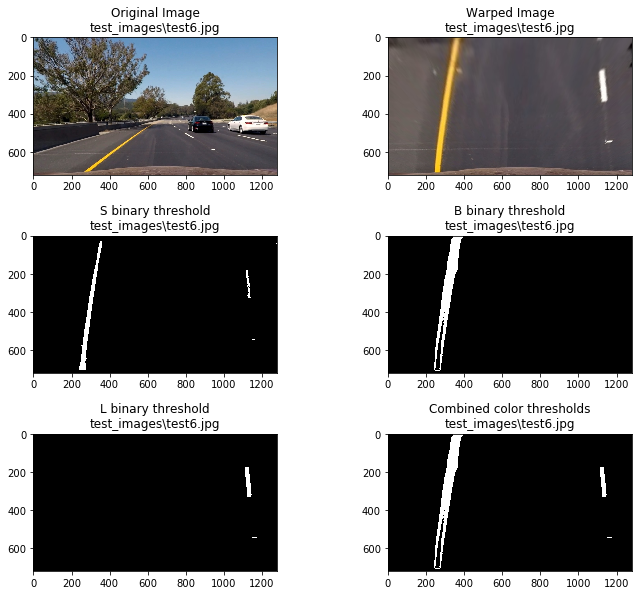

In [16]:
for image in glob.glob('test_images/test*.jpg'):
    applyThreshold(image)

## 5 Fit a polynomial to the lane line & Calculate vehicle position & Calculate lane line curviture

In [17]:
def fillLane(image):
    
    combined_binary = applyThreshold(image, plot=False)
    
    right_x = []
    right_y = []
    left_x = []
    left_y = []
    
    x, y = np.nonzero(np.transpose(combined_binary))
    i = 720
    j = 630
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            left_x.extend(x_window.tolist())
            left_y.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            right_x.extend(x_window.tolist())
            right_y.extend(y_window.tolist())
        i -= 90
        j -= 90

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
    
    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(left_y, left_x, 2)
    left_fit_x = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    right_fit = np.polyfit(right_y, right_x, 2)
    right_fit_x = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    
    # Process right part of image
    right_x_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    right_x = np.append(right_x,right_x_int)
    right_y = np.append(right_y, 720)
    right_x = np.append(right_x,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    right_y = np.append(right_y, 0)
    
    # Process left part of image
    left_x_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    left_x = np.append(left_x,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    left_y = np.append(left_y, 0)
    
    # Sort each list which are used below for curviture
    left_sort = np.argsort(left_y)
    right_sort = np.argsort(right_y)
    
    left_y = left_y[left_sort]
    left_x = left_x[left_sort]
    right_y = right_y[right_sort]
    right_x = right_x[right_sort]
    
    left_fit = np.polyfit(left_y, left_x, 2)
    left_fit_x = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    right_fit = np.polyfit(right_y, right_x, 2)
    right_fit_x = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(left_y) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(left_y) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculate the position of the vehicle
    center = abs(640 - ((right_x_int+left_x_int)/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fit_x, left_y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fit_x, right_y]))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    new_warp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, new_warp, 0.5, 0)
    
    # Plot images
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor((birdsEye(image, plot=False)[0]), cv2.COLOR_BGR2RGB))
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fit_x, left_y, color='green', linewidth=3)
    ax1.plot(right_fit_x, right_y, color='green', linewidth=3)
    ax1.set_title('Fit Polynomial to Lane Lines' + '\n' + image, fontsize=12)
    ax1.invert_yaxis()
    ax2.imshow(result)
    ax2.set_title('Fill Lane Between Polynomials' + '\n' + image, fontsize=12)
    
    if center < 640:
        ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),
                 style='italic', color='red', fontsize=12)
    else:
        ax2.text(150, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),
                 style='italic', color='red', fontsize=16)
    ax2.text(150, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='red', fontsize=16)

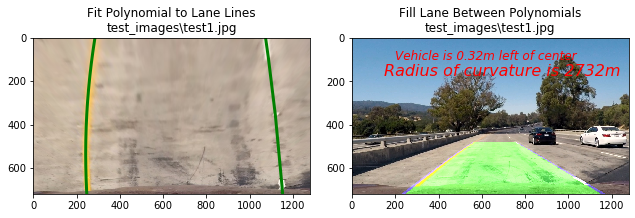

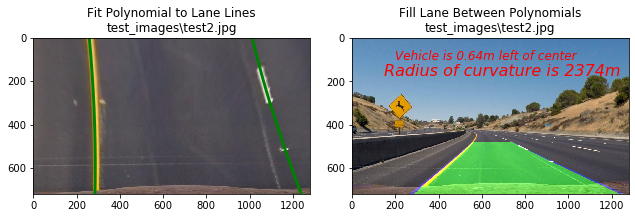

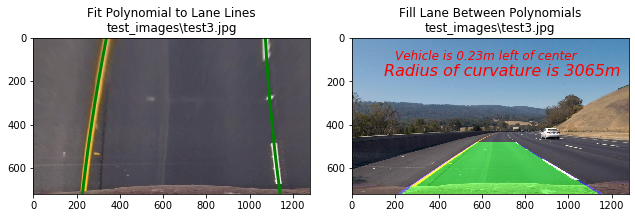

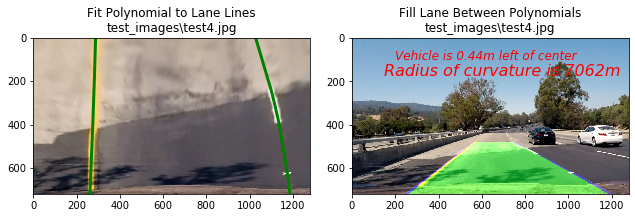

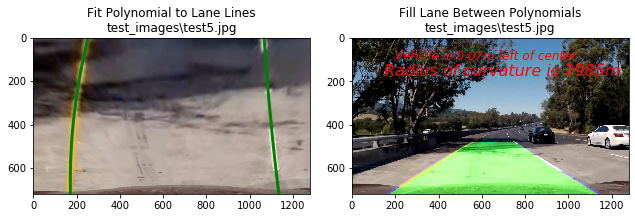

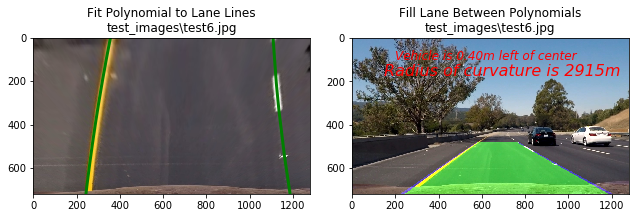

In [18]:
for image in glob.glob('test_images/test*.jpg'):
    fillLane(image)

# Video Processing Pipeline

First I am going to introduce the class Line() for the lines to store attributes for the lane lines from one frame to the next. Inside the class I will define several functions which will be used to detect the pixels belonging to each lane line.

In [19]:
class Line:
    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remember x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
        
    def foundSearch(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        It uses a sliding window to search for lane pixels in close proximity (+/- 25 pixels in the x direction)
        around the previous detected polynomial. 
        '''
        xvals = []
        yvals = []
        
        if self.found == True: 
            i = 720
            j = 630
            
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                    
                i -= 90
                j -= 90
                
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
            
        return xvals, yvals, self.found
    
    def blindSearch(self, x, y, image):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. It uses a slinding window approach to detect peaks in a histogram of the
        binary thresholded image. Pixels in close proimity to the detected peaks are considered to belong
        to the lane lines.
        '''
        xvals = []
        yvals = []
        
        if self.found == False: 
            i = 720
            j = 630
            
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                    
                i -= 90
                j -= 90
                
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
            
        return xvals, yvals, self.found
    
    def radiusOfCurvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sortVals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        
        return sorted_xvals, sorted_yvals
    
    def getIntercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        
        return bottom, top

Next I create a function processVideo() which processes a video frame by frame and outputs an annotated video with lane lines, radius of curvature and distance from center.

The video processing pipeline is very similar to the fillLanes() function established earlier in the report, except that the video pipeline stores information about the lane lines across frames to average the lane positions and ensure a smooth output which is less impacted by outliers.

The video pipeline also knows whether or not the lane line was detected in the previous frame, and if it was, it only checks for lane pixels in a tight window around the previous polynomial, ensuring a high confidence detection. If the lane line was not detected in the previous frames (and for the first 5 frames of the video) The pipeline performs the same search which was performed in the fillLanes() function based on identifying peaks in a histogram.

In [20]:
# Video Processing Pipeline
def processVideo(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Perform perspective transform
    offset = 0
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Generate binary thresholded images
    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Set the upper and lower thresholds for the b channel
    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # Set the upper and lower thresholds for the l channel
    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary)) 

    # Search for left lane pixels around previous polynomial
    if Left.found == True:
        leftx, lefty, Left.found = Left.foundSearch(x, y)
        
    # Search for right lane pixels around previous polynomial
    if Right.found == True:
        rightx, righty, Right.found = Right.foundSearch(x, y)

    # Perform blind search for right lane lines
    if Right.found == False:
        rightx, righty, Right.found = Right.blindSearch(x, y, combined_binary)

    # Perform blind search for left lane lines
    if Left.found == False:
        leftx, lefty, Left.found = Left.blindSearch(x, y, combined_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.getIntercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sortVals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.getIntercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sortVals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radiusOfCurvature(leftx, lefty)
    right_curverad = Right.radiusOfCurvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        

    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 3)
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}(m) left of the center'.format(distance_from_center), (100,80),
                 cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 3)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}(m) right of the center'.format(distance_from_center), (100,80),
                 cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 3)
        
    Left.count += 1
    return result

In [21]:
Left = Line()
Right = Line()
video_output = 'project_result.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(processVideo) 
white_clip.write_videofile(video_output, audio=False)

t:   0%|          | 0/50 [00:00<?, ?it/s, now=None]Moviepy - Building video project_result.mp4.
Moviepy - Writing video project_result.mp4

t: 100%|██████████| 50/50 [00:51<00:00,  1.05s/it, now=None]Moviepy - Done !
Moviepy - video ready project_result.mp4


In [22]:
from IPython.display import HTML

In [24]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('project_result.mp4'))

In [25]:
Left = Line()
Right = Line()
challenge_output = 'challenge_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip1.fl_image(processVideo) 
challenge_clip.write_videofile(challenge_output, audio=False)

t:   0%|          | 0/485 [00:00<?, ?it/s, now=None]Moviepy - Building video challenge_result.mp4.
Moviepy - Writing video challenge_result.mp4

t: 100%|██████████| 485/485 [08:21<00:00,  1.02s/it, now=None]Moviepy - Done !
Moviepy - video ready challenge_result.mp4


In [26]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))

In [27]:
Left = Line()
Right = Line()
challenge_output = 'harder_challenge_result.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
challenge_clip = clip1.fl_image(processVideo) 
challenge_clip.write_videofile(challenge_output, audio=False)

t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]Moviepy - Building video harder_challenge_result.mp4.
Moviepy - Writing video harder_challenge_result.mp4

t: 100%|██████████| 1199/1199 [23:44<00:00,  1.36s/it, now=None]Moviepy - Done !
Moviepy - video ready harder_challenge_result.mp4


In [28]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))